# Cardio-Vascular Disease Detection

In [1]:
#importing required libraries

import os
import plotly.graph_objects as go 
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
import missingno as msno 
import plotly.graph_objects as go 
import plotly.express as px 
import torch
import sklearn
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader 
from tqdm import tqdm
import torch.functional as F
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix,plot_roc_curve
from sklearn import tree

In [2]:
data = pd.read_csv("cardio_train.csv")

In [3]:
data

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,988,22469,1,155,69.0,130,80,2,2,0,0,1,0
1,989,14648,1,163,71.0,110,70,1,1,0,0,1,1
2,990,21901,1,165,70.0,120,80,1,1,0,0,1,0
3,991,14549,2,165,85.0,120,80,1,1,1,1,1,0
4,992,23393,1,155,62.0,120,80,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69296,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0
69297,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1
69298,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1
69299,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1


In [4]:
data.shape

(69301, 13)

In [5]:
data.columns

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [6]:
data.info


<bound method DataFrame.info of           id    age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc   
0        988  22469       1     155    69.0    130     80            2     2  \
1        989  14648       1     163    71.0    110     70            1     1   
2        990  21901       1     165    70.0    120     80            1     1   
3        991  14549       2     165    85.0    120     80            1     1   
4        992  23393       1     155    62.0    120     80            1     1   
...      ...    ...     ...     ...     ...    ...    ...          ...   ...   
69296  99993  19240       2     168    76.0    120     80            1     1   
69297  99995  22601       1     158   126.0    140     90            2     2   
69298  99996  19066       2     183   105.0    180     90            3     1   
69299  99998  22431       1     163    72.0    135     80            1     2   
69300  99999  20540       1     170    72.0    120     80            2     1   

       

In [7]:
data.isna

<bound method DataFrame.isna of           id    age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc   
0        988  22469       1     155    69.0    130     80            2     2  \
1        989  14648       1     163    71.0    110     70            1     1   
2        990  21901       1     165    70.0    120     80            1     1   
3        991  14549       2     165    85.0    120     80            1     1   
4        992  23393       1     155    62.0    120     80            1     1   
...      ...    ...     ...     ...     ...    ...    ...          ...   ...   
69296  99993  19240       2     168    76.0    120     80            1     1   
69297  99995  22601       1     158   126.0    140     90            2     2   
69298  99996  19066       2     183   105.0    180     90            3     1   
69299  99998  22431       1     163    72.0    135     80            1     2   
69300  99999  20540       1     170    72.0    120     80            2     1   

       

In [8]:
data.drop('id', inplace=True, axis=1)
data

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,22469,1,155,69.0,130,80,2,2,0,0,1,0
1,14648,1,163,71.0,110,70,1,1,0,0,1,1
2,21901,1,165,70.0,120,80,1,1,0,0,1,0
3,14549,2,165,85.0,120,80,1,1,1,1,1,0
4,23393,1,155,62.0,120,80,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
69296,19240,2,168,76.0,120,80,1,1,1,0,1,0
69297,22601,1,158,126.0,140,90,2,2,0,0,1,1
69298,19066,2,183,105.0,180,90,3,1,0,1,0,1
69299,22431,1,163,72.0,135,80,1,2,0,0,0,1


In [9]:
data.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000
mean,19468.786280,1.349519,164.362217,74.203027,128.829584,96.650092,1.366806,1.226447,0.088051,0.053881,0.803986,0.499589
std,2467.261818,0.476821,8.205337,14.383469,154.775805,189.096240,0.680270,0.572246,0.283371,0.225784,0.396982,0.500003
min,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19704.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21326.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
data.nunique()

age            8069
gender            2
height          108
weight          285
ap_hi           153
ap_lo           157
cholesterol       3
gluc              3
smoke             2
alco              2
active            2
cardio            2
dtype: int64

In [11]:
data.dtypes

age              int64
gender           int64
height           int64
weight         float64
ap_hi            int64
ap_lo            int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
dtype: object

<Axes: >

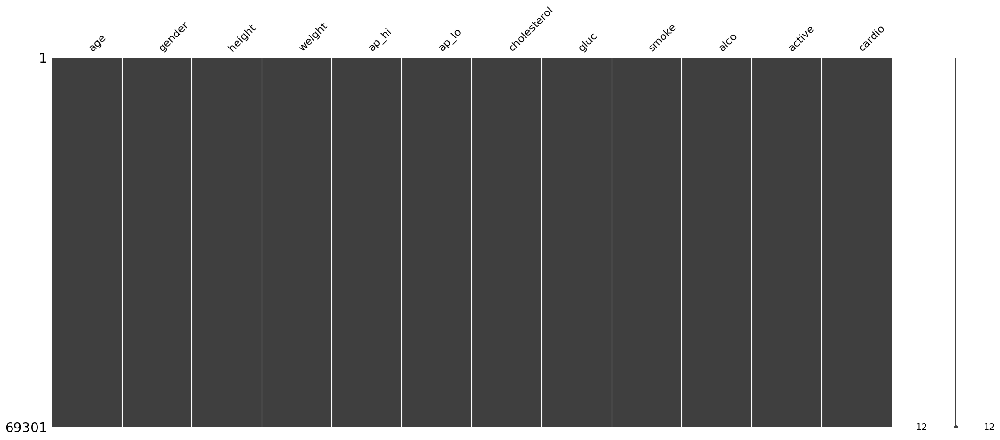

In [12]:
msno.matrix(data)

##### No NA values found

In [13]:
duplicated = data.duplicated().sum()
if duplicated:
    print("Duplicate rows in dataset : {}".format(duplicated))
else: 
    print("Dataset does not contain duplicate values")

Duplicate rows in dataset : 24


In [14]:
data['gender'] = data.gender.replace({1: "Male", 2: "Female"})
data['cholesterol'] = data.cholesterol.replace({1: "normal", 2:"above normal", 3: "well above normal"})
data['gluc'] = data.gluc.replace({1: "normal", 2:"above normal", 3: "well above normal"})
data['smoke'] = data.smoke.replace({1: "Yes", 0: "No"})
data['alco'] = data.alco.replace({1: "Yes", 0: "No"})
data['active'] = data.active.replace({1: "Yes", 0: "No"})
data['cardio'] = data.cardio.replace({1: "Present", 0: "Absent"})

age          Axes(0.125,0.53;0.0945122x0.35)
height    Axes(0.238415,0.53;0.0945122x0.35)
weight    Axes(0.351829,0.53;0.0945122x0.35)
ap_hi     Axes(0.465244,0.53;0.0945122x0.35)
ap_lo     Axes(0.578659,0.53;0.0945122x0.35)
dtype: object

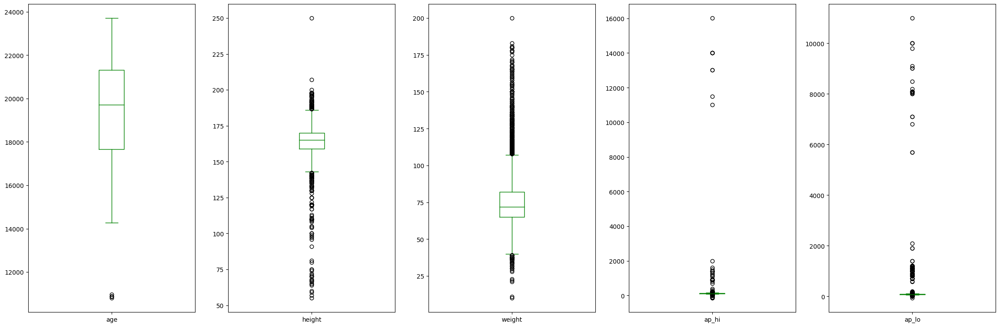

In [15]:
data.plot(kind='box', subplots=True, layout=(2,7),sharex=False,sharey=False, figsize=(40, 20), color='green')

In [16]:
fig = px.box(data, x="cardio", y="age")
fig.show()
# age is in days

In [17]:
# define continuous variable & plot
continous_features = ['age','height','weight','ap_hi', 'ap_lo']  
def outliers(df_out, drop = False):
    for each_feature in df_out.columns:
        feature_data = df_out[each_feature]
        Q1 = np.percentile(feature_data, 25.) # 25th percentile of the data of the given feature
        Q3 = np.percentile(feature_data, 75.) # 75th percentile of the data of the given feature
        IQR = Q3-Q1 #Interquartile Range
        outlier_step = IQR * 1.5 #That's we were talking about above
        outliers = feature_data[~((feature_data >= Q1 - outlier_step) & (feature_data <= Q3 + outlier_step))].index.tolist()  
        if not drop:
            print('For the feature {}, No of Outliers is {}'.format(each_feature, len(outliers)))
        if drop:
            data.drop(outliers, inplace = True, errors = 'ignore')
            print('Outliers from {} feature removed'.format(each_feature))

outliers(data[continous_features])

For the feature age, No of Outliers is 4
For the feature height, No of Outliers is 515
For the feature weight, No of Outliers is 1802
For the feature ap_hi, No of Outliers is 1419
For the feature ap_lo, No of Outliers is 4584


In [18]:
outliers(data[continous_features], drop = True)

Outliers from age feature removed
Outliers from height feature removed
Outliers from weight feature removed
Outliers from ap_hi feature removed
Outliers from ap_lo feature removed


cardio
Absent     31325
Present    30556
Name: count, dtype: int64


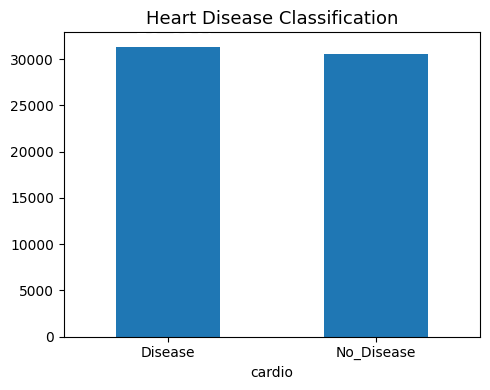

In [19]:
print(data.cardio.value_counts())

fig, ax = plt.subplots(figsize=(5,4))
name = ["Disease", "No_Disease"]
ax = data.cardio.value_counts().plot(kind='bar')
ax.set_title("Heart Disease Classification", fontsize = 13)
ax.set_xticklabels (name, rotation = 0)

# To calculate the percentage
totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.09, i.get_height()-50, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=14,
                color='white', weight = 'bold')
    
plt.tight_layout()

Text(0.5, 1.0, 'Age Distribution')

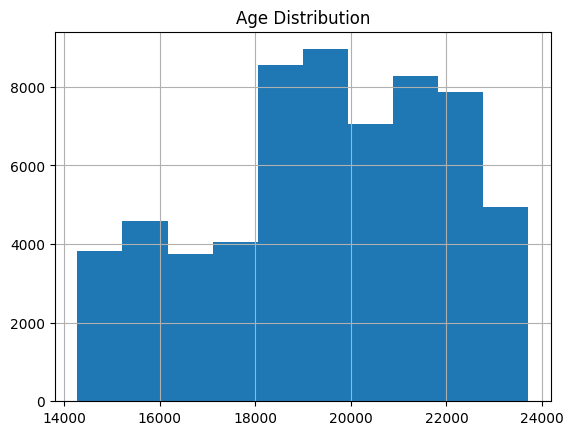

In [20]:
# print(df.age.value_counts())
data['age'].hist().plot(kind='bar')
plt.title('Age Distribution')

age
21892    30
19733    29
18253    29
19741    29
18236    28
19655    27
18184    27
21927    27
21147    27
19709    27
19657    27
20457    26
21867    26
20347    26
20448    26
21159    26
21225    26
20376    26
21222    26
20370    26
Name: count, dtype: int64


Text(0, 0.5, 'Age distribution')

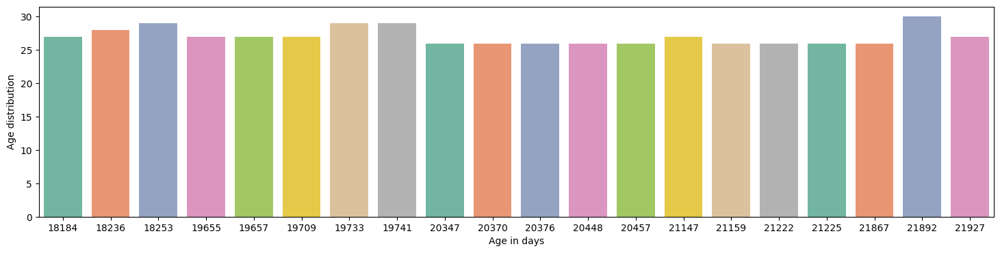

In [21]:
# Analyze distribution in age in range 500
print(data.age.value_counts()[:20])
plt.rcParams['figure.figsize'] = [18, 4]
sns.barplot(x=data.age.value_counts()[:20].index, y = data.age.value_counts()[:20].values,palette='Set2')
plt.xlabel('Age in days')
plt.ylabel('Age distribution')


In [22]:
# to know yougest and oldest patient
print("Age in years (approx.):")
print("Minimum age: ", min(data.age)/365)
print("Maximum age: ",max(data.age)/365)
print("Mean age: ",data.age.mean()/365)

Age in years (approx.):
Minimum age:  39.12876712328767
Maximum age:  64.96712328767123
Mean age:  53.40745372304288


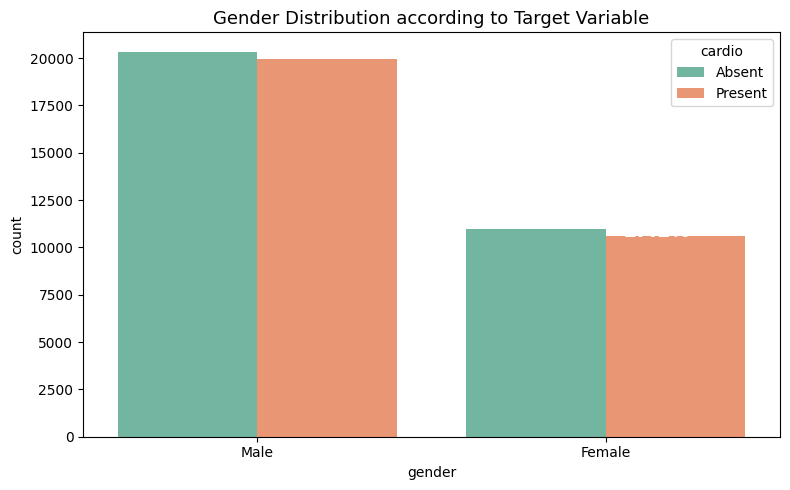

In [23]:
fig, ax = plt.subplots(figsize=(8,5))
name = data['gender']
ax = sns.countplot(x='gender', hue='cardio', data=data, palette='Set2')
ax.set_title("Gender Distribution according to Target Variable", fontsize = 13)
totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.05, i.get_height()-15,
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=14,
                color='white', weight = 'bold')  
plt.tight_layout()

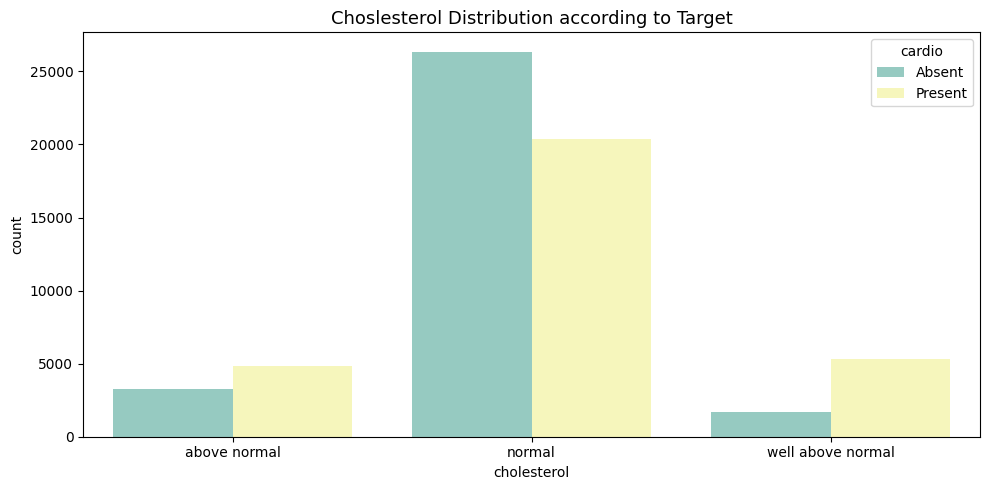

In [24]:
fig, ax = plt.subplots(figsize=(10,5))
name = data['cholesterol']
ax = sns.countplot(x='cholesterol', hue='cardio', data=data, palette='Set3')
ax.set_title("Choslesterol Distribution according to Target", fontsize = 13)
#ax.set_xticklabels (name, rotation = 0)

totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.03, i.get_height()-5,
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=14,
                color='white', weight = 'bold')  
plt.tight_layout()

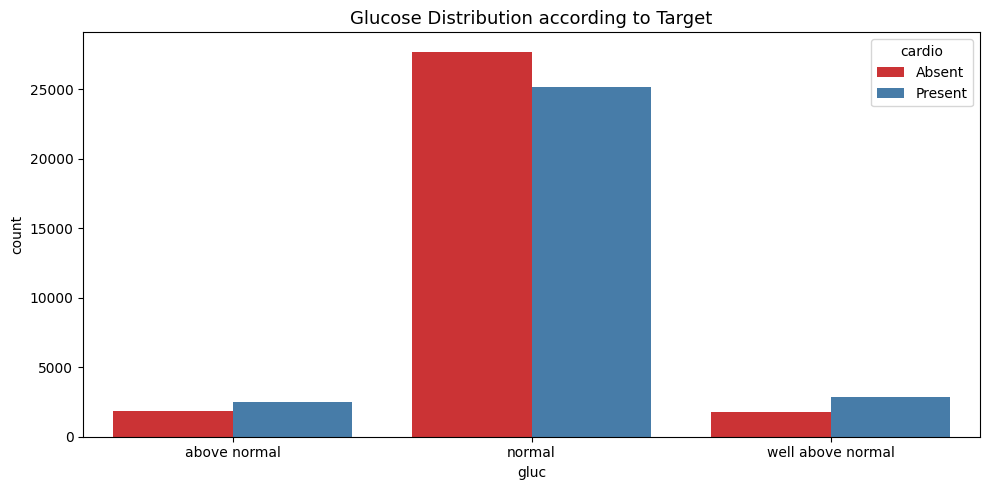

In [25]:
fig, ax = plt.subplots(figsize=(10,5))
name = data['gluc']
ax = sns.countplot(x='gluc', hue='cardio', data=data, palette='Set1')
ax.set_title("Glucose Distribution according to Target", fontsize = 13)
#ax.set_xticklabels (name, rotation = 0)

totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.03, i.get_height()-5,
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=14,
                color='white', weight = 'bold')  
plt.tight_layout()

Text(0.5, 1.0, 'Height Distribution')

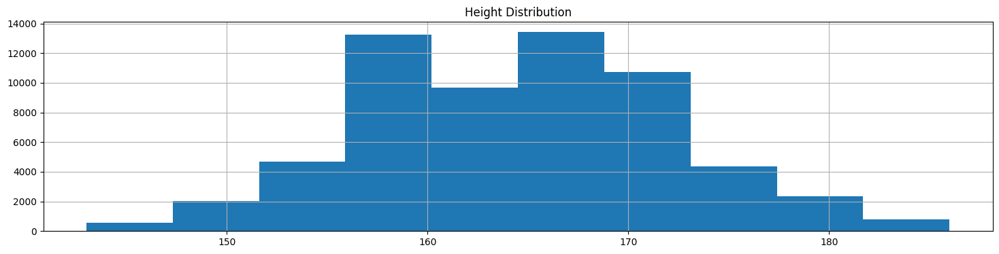

In [26]:
# height
data['height'].hist().plot(kind='bar')
plt.title('Height Distribution')

Text(0.5, 1.0, 'Weight Distribution')

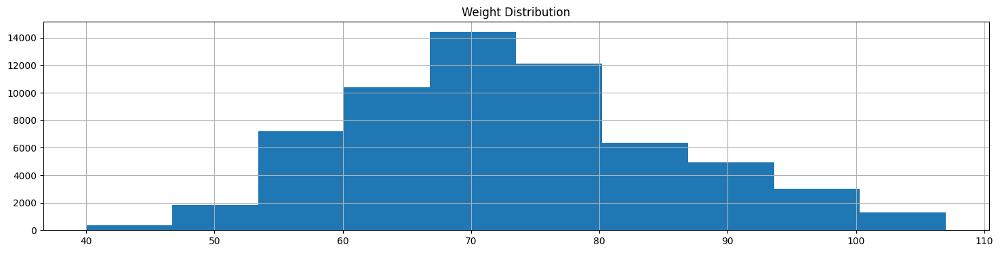

In [27]:
# weight
data['weight'].hist().plot(kind='bar')
plt.title('Weight Distribution')

Text(0.5, 1.0, 'Systolic Blood Pressure Distribution')

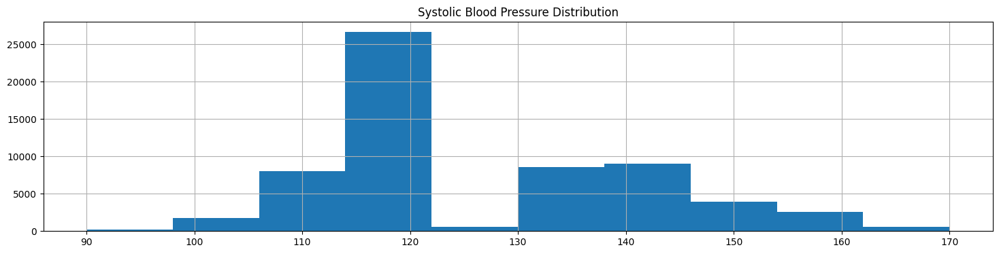

In [28]:
# Systolic BP
data['ap_hi'].hist().plot(kind='bar')
plt.title('Systolic Blood Pressure Distribution')

Text(0.5, 1.0, 'Diastolic Blood Pressure Distribution')

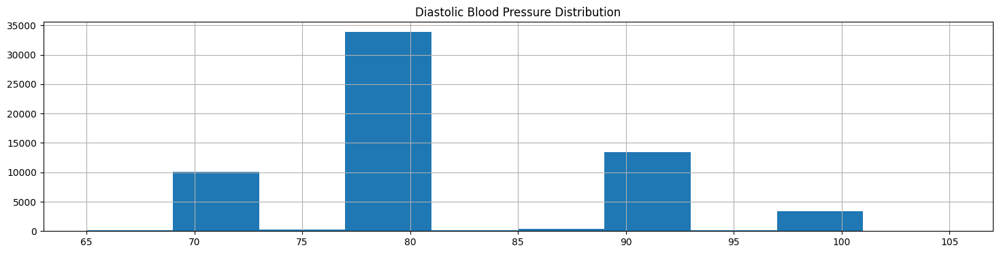

In [29]:
# Diastolic BP
data['ap_lo'].hist().plot(kind='bar')
plt.title('Diastolic Blood Pressure Distribution')

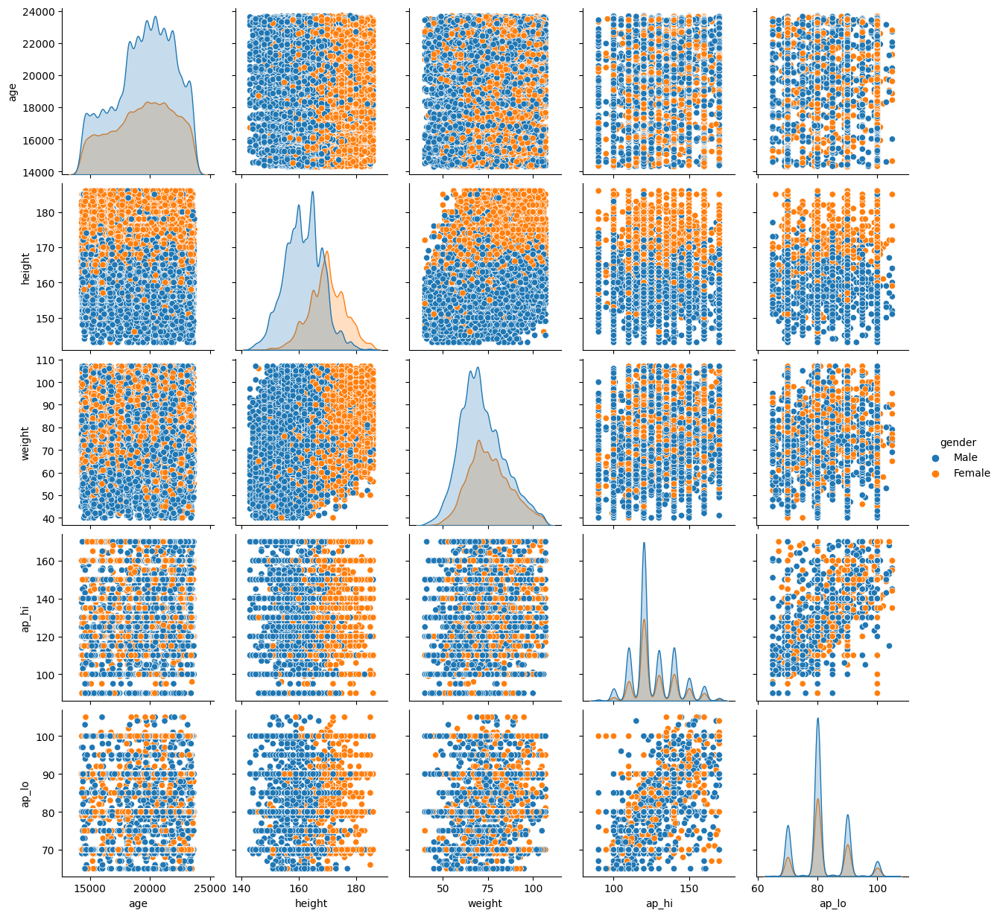

In [30]:
sns.pairplot(data, hue = 'gender')
plt.show()

In [31]:
df = pd.read_csv("cardio_train.csv")
df.dtypes

id               int64
age              int64
gender           int64
height           int64
weight         float64
ap_hi            int64
ap_lo            int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
dtype: object

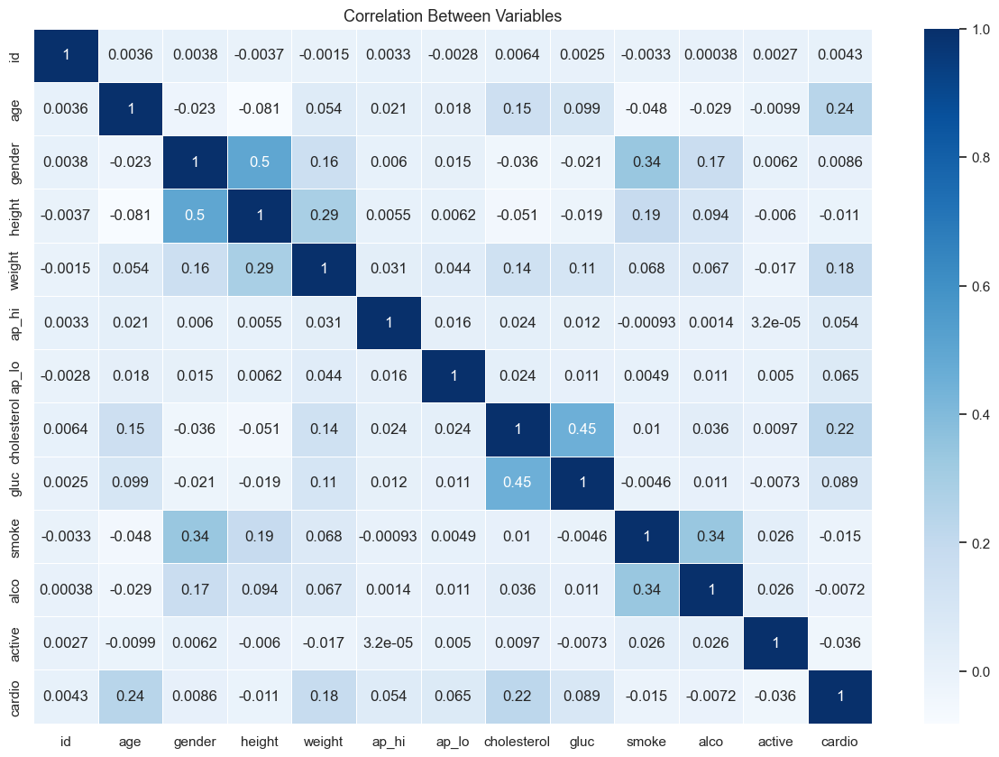

In [32]:
sns.set(style="white") 
plt.rcParams['figure.figsize'] = (15, 10) 
sns.heatmap(df.corr(), annot = True, linewidths=.5, cmap="Blues")
plt.title('Correlation Between Variables', fontsize = 13)
plt.show()

# Modeling

In [33]:
df = pd.read_csv("cardio_train.csv")

In [34]:
scaled_values = {}

In [35]:
for x in df.columns:
    
    maxval = max(df[x])
    scaled_values[x] = maxval
    df[x] = df[x]/maxval

In [36]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.00988,0.947539,0.5,0.620,0.345,0.008115,0.007273,0.666667,0.666667,0.0,0.0,1.0,0.0
1,0.00989,0.617720,0.5,0.652,0.355,0.006866,0.006364,0.333333,0.333333,0.0,0.0,1.0,1.0
2,0.00990,0.923586,0.5,0.660,0.350,0.007491,0.007273,0.333333,0.333333,0.0,0.0,1.0,0.0
3,0.00991,0.613545,1.0,0.660,0.425,0.007491,0.007273,0.333333,0.333333,1.0,1.0,1.0,0.0
4,0.00992,0.986505,0.5,0.620,0.310,0.007491,0.007273,0.333333,0.333333,0.0,0.0,1.0,0.0


In [37]:
# starting from index 1 to remove index column
X, y = df[df.columns[1:]].values[:,:-1], df[df.columns[1:]].values[:,-1]

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

## XGBoost

In [39]:
#creating the model object
model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss',booster ="gbtree",max_depth =6)

C:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:1395: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.



In [40]:
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None, ...)

In [41]:
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.733730941272666

In [42]:
ps = precision_score(y_pred,y_test)
rs = recall_score(y_pred, y_test)
f1s = f1_score(y_pred,y_test)
print(f"Precision {ps}\nRecall {rs}\nF1 Score {f1s}")

Precision 0.6953757225433526
Recall 0.7525020850708924
F1 Score 0.722811936711396


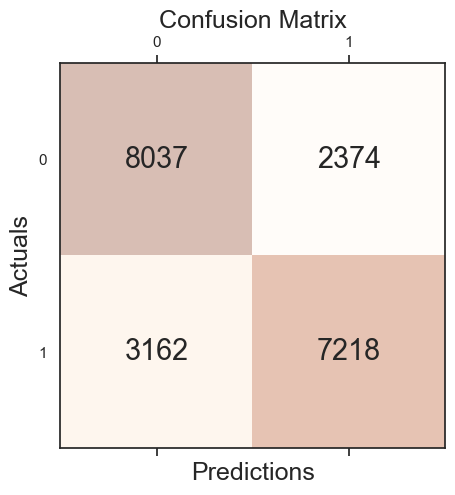

In [43]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large') 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

## Naive Bayes

In [44]:
nb = GaussianNB()
nb.fit(X_train, y_train)

GaussianNB()

In [45]:
y_pred = nb.predict(X_test)

In [46]:
ps = precision_score(y_pred,y_test)
rs = recall_score(y_pred, y_test)
f1s = f1_score(y_pred,y_test)
print(f"Precision {ps}\nRecall {rs}\nF1 Score {f1s}")

Precision 0.2948940269749518
Recall 0.7310723668497731
F1 Score 0.4202649824946798


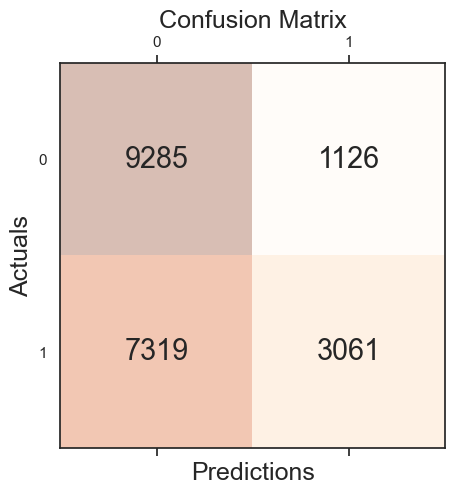

In [47]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large') 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

In [48]:
print(nb.score(X_test, y_test))

0.5938146313308643


## ANN

In [49]:
class CustomDataset(Dataset):
    def __init__(self,data):
        self.data = data
        self.xvals = data[:,:-1]
        self.yvals = data[:,-1]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, i):
        X = torch.tensor(self.xvals[i], dtype = torch.float32)
        y = torch.tensor([self.yvals[i]], dtype = torch.float32)
        return X,y

In [50]:
ds = CustomDataset(df.values)
train_size = int(0.8 * len(ds))
test_size = len(ds) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(ds, [train_size, test_size])
train_loader = DataLoader(dataset= train_dataset, shuffle=True, batch_size= 32)
test_loader = DataLoader(dataset= test_dataset, shuffle=True, batch_size= 1)

In [52]:
device = "cuda:0" if torch.cuda.is_available () else "cpu"

class Net(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.layers  = nn.Sequential(
            nn.Linear(12,64),
            nn.ReLU(),
            nn.Linear(64,1),            
            nn.Sigmoid()            
        )

    def forward(self, x):
        x = self.layers(x)
        
        return x
NET = Net().to(device)

In [53]:
def check_acc():
    NET.eval()
    total = 0
    correct = 0
    for inputs, label in tqdm(test_loader):
        inputs, label = inputs.to(device), label.to(device)
        
        total+=1
        outputs = NET(inputs)
        OP = torch.where(outputs> 0.5, torch.tensor(1).to(device), torch.tensor(0).to(device))
        OPP = torch.where(OP!=label,0,1).flatten()
        
        correct += sum(OPP).item()        
    return correct/total
    

In [54]:
criterion = nn.BCELoss()
optimizer = optim.Adam(NET.parameters(), lr=0.001)
losses = []
EPOCHS  = 120

In [55]:
print(f"===_Begin Training_===")
print(f"Iterations per epoch = {len(train_loader)}, num epochs = {EPOCHS}")
for epoch in tqdm(range(100)):
    NET.train()
    epoch_loss = 0
    for i , (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = NET(inputs)
        outputs = outputs
        loss = criterion(outputs,labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        
        if i %500== 0:
            print(f"Epoch:{epoch}/{EPOCHS}, Iteration: {i}")
    losses.append(epoch_loss)
    print(f"Epoch:{epoch}/{EPOCHS} - > LOSS: {epoch_loss}")

===_Begin Training_===
Iterations per epoch = 1733, num epochs = 120


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Epoch:0/120, Iteration: 0
Epoch:0/120, Iteration: 500
Epoch:0/120, Iteration: 1000
Epoch:0/120, Iteration: 1500


  1%|▊                                                                                 | 1/100 [00:02<04:30,  2.73s/it]

Epoch:0/120 - > LOSS: 1147.3676146268845
Epoch:1/120, Iteration: 0
Epoch:1/120, Iteration: 500
Epoch:1/120, Iteration: 1000
Epoch:1/120, Iteration: 1500


  2%|█▋                                                                                | 2/100 [00:05<04:15,  2.61s/it]

Epoch:1/120 - > LOSS: 1104.3404300808907
Epoch:2/120, Iteration: 0
Epoch:2/120, Iteration: 500
Epoch:2/120, Iteration: 1000
Epoch:2/120, Iteration: 1500


  3%|██▍                                                                               | 3/100 [00:08<04:32,  2.81s/it]

Epoch:2/120 - > LOSS: 1089.86626714468
Epoch:3/120, Iteration: 0
Epoch:3/120, Iteration: 500
Epoch:3/120, Iteration: 1000
Epoch:3/120, Iteration: 1500


  4%|███▎                                                                              | 4/100 [00:10<04:21,  2.72s/it]

Epoch:3/120 - > LOSS: 1085.767708748579
Epoch:4/120, Iteration: 0
Epoch:4/120, Iteration: 500
Epoch:4/120, Iteration: 1000
Epoch:4/120, Iteration: 1500


  5%|████                                                                              | 5/100 [00:13<04:22,  2.76s/it]

Epoch:4/120 - > LOSS: 1084.1975019574165
Epoch:5/120, Iteration: 0
Epoch:5/120, Iteration: 500
Epoch:5/120, Iteration: 1000
Epoch:5/120, Iteration: 1500


  6%|████▉                                                                             | 6/100 [00:16<04:23,  2.80s/it]

Epoch:5/120 - > LOSS: 1082.0792402923107
Epoch:6/120, Iteration: 0
Epoch:6/120, Iteration: 500
Epoch:6/120, Iteration: 1000
Epoch:6/120, Iteration: 1500


  7%|█████▋                                                                            | 7/100 [00:19<04:27,  2.87s/it]

Epoch:6/120 - > LOSS: 1080.7996071577072
Epoch:7/120, Iteration: 0
Epoch:7/120, Iteration: 500
Epoch:7/120, Iteration: 1000
Epoch:7/120, Iteration: 1500


  8%|██████▌                                                                           | 8/100 [00:22<04:21,  2.85s/it]

Epoch:7/120 - > LOSS: 1078.8107352852821
Epoch:8/120, Iteration: 0
Epoch:8/120, Iteration: 500
Epoch:8/120, Iteration: 1000
Epoch:8/120, Iteration: 1500


  9%|███████▍                                                                          | 9/100 [00:25<04:12,  2.77s/it]

Epoch:8/120 - > LOSS: 1077.121144682169
Epoch:9/120, Iteration: 0
Epoch:9/120, Iteration: 500
Epoch:9/120, Iteration: 1000
Epoch:9/120, Iteration: 1500


 10%|████████                                                                         | 10/100 [00:28<04:21,  2.90s/it]

Epoch:9/120 - > LOSS: 1075.0553031861782
Epoch:10/120, Iteration: 0
Epoch:10/120, Iteration: 500
Epoch:10/120, Iteration: 1000
Epoch:10/120, Iteration: 1500


 11%|████████▉                                                                        | 11/100 [00:31<04:16,  2.89s/it]

Epoch:10/120 - > LOSS: 1071.5782362520695
Epoch:11/120, Iteration: 0
Epoch:11/120, Iteration: 500
Epoch:11/120, Iteration: 1000
Epoch:11/120, Iteration: 1500


 12%|█████████▋                                                                       | 12/100 [00:33<04:05,  2.79s/it]

Epoch:11/120 - > LOSS: 1069.4526959955692
Epoch:12/120, Iteration: 0
Epoch:12/120, Iteration: 500
Epoch:12/120, Iteration: 1000
Epoch:12/120, Iteration: 1500


 13%|██████████▌                                                                      | 13/100 [00:36<04:04,  2.81s/it]

Epoch:12/120 - > LOSS: 1068.5513064861298
Epoch:13/120, Iteration: 0
Epoch:13/120, Iteration: 500
Epoch:13/120, Iteration: 1000
Epoch:13/120, Iteration: 1500


 14%|███████████▎                                                                     | 14/100 [00:38<03:53,  2.71s/it]

Epoch:13/120 - > LOSS: 1064.4803976416588
Epoch:14/120, Iteration: 0
Epoch:14/120, Iteration: 500
Epoch:14/120, Iteration: 1000
Epoch:14/120, Iteration: 1500


 15%|████████████▏                                                                    | 15/100 [00:41<03:45,  2.65s/it]

Epoch:14/120 - > LOSS: 1061.1778747439384
Epoch:15/120, Iteration: 0
Epoch:15/120, Iteration: 500
Epoch:15/120, Iteration: 1000
Epoch:15/120, Iteration: 1500


 16%|████████████▉                                                                    | 16/100 [00:44<03:56,  2.82s/it]

Epoch:15/120 - > LOSS: 1057.6643993258476
Epoch:16/120, Iteration: 0
Epoch:16/120, Iteration: 500
Epoch:16/120, Iteration: 1000
Epoch:16/120, Iteration: 1500


 17%|█████████████▊                                                                   | 17/100 [00:47<03:56,  2.85s/it]

Epoch:16/120 - > LOSS: 1054.3177836835384
Epoch:17/120, Iteration: 0
Epoch:17/120, Iteration: 500
Epoch:17/120, Iteration: 1000
Epoch:17/120, Iteration: 1500


 18%|██████████████▌                                                                  | 18/100 [00:50<03:52,  2.83s/it]

Epoch:17/120 - > LOSS: 1050.8594354391098
Epoch:18/120, Iteration: 0
Epoch:18/120, Iteration: 500
Epoch:18/120, Iteration: 1000
Epoch:18/120, Iteration: 1500


 19%|███████████████▍                                                                 | 19/100 [00:52<03:43,  2.76s/it]

Epoch:18/120 - > LOSS: 1046.698359489441
Epoch:19/120, Iteration: 0
Epoch:19/120, Iteration: 500
Epoch:19/120, Iteration: 1000
Epoch:19/120, Iteration: 1500


 20%|████████████████▏                                                                | 20/100 [00:55<03:39,  2.74s/it]

Epoch:19/120 - > LOSS: 1042.21535384655
Epoch:20/120, Iteration: 0
Epoch:20/120, Iteration: 500
Epoch:20/120, Iteration: 1000
Epoch:20/120, Iteration: 1500


 21%|█████████████████                                                                | 21/100 [00:58<03:29,  2.65s/it]

Epoch:20/120 - > LOSS: 1037.5131694674492
Epoch:21/120, Iteration: 0
Epoch:21/120, Iteration: 500
Epoch:21/120, Iteration: 1000
Epoch:21/120, Iteration: 1500


 22%|█████████████████▊                                                               | 22/100 [01:00<03:31,  2.71s/it]

Epoch:21/120 - > LOSS: 1032.5400741100311
Epoch:22/120, Iteration: 0
Epoch:22/120, Iteration: 500
Epoch:22/120, Iteration: 1000
Epoch:22/120, Iteration: 1500


 23%|██████████████████▋                                                              | 23/100 [01:03<03:24,  2.66s/it]

Epoch:22/120 - > LOSS: 1027.567402034998
Epoch:23/120, Iteration: 0
Epoch:23/120, Iteration: 500
Epoch:23/120, Iteration: 1000
Epoch:23/120, Iteration: 1500


 24%|███████████████████▍                                                             | 24/100 [01:06<03:19,  2.62s/it]

Epoch:23/120 - > LOSS: 1023.5917856693268
Epoch:24/120, Iteration: 0
Epoch:24/120, Iteration: 500
Epoch:24/120, Iteration: 1000
Epoch:24/120, Iteration: 1500


 25%|████████████████████▎                                                            | 25/100 [01:08<03:14,  2.59s/it]

Epoch:24/120 - > LOSS: 1018.3536449074745
Epoch:25/120, Iteration: 0
Epoch:25/120, Iteration: 500
Epoch:25/120, Iteration: 1000
Epoch:25/120, Iteration: 1500


 26%|█████████████████████                                                            | 26/100 [01:11<03:17,  2.67s/it]

Epoch:25/120 - > LOSS: 1013.8836486637592
Epoch:26/120, Iteration: 0
Epoch:26/120, Iteration: 500
Epoch:26/120, Iteration: 1000
Epoch:26/120, Iteration: 1500


 27%|█████████████████████▊                                                           | 27/100 [01:14<03:18,  2.72s/it]

Epoch:26/120 - > LOSS: 1009.8307977318764
Epoch:27/120, Iteration: 0
Epoch:27/120, Iteration: 500
Epoch:27/120, Iteration: 1000
Epoch:27/120, Iteration: 1500


 28%|██████████████████████▋                                                          | 28/100 [01:17<03:17,  2.74s/it]

Epoch:27/120 - > LOSS: 1005.997606754303
Epoch:28/120, Iteration: 0
Epoch:28/120, Iteration: 500
Epoch:28/120, Iteration: 1000
Epoch:28/120, Iteration: 1500


 29%|███████████████████████▍                                                         | 29/100 [01:19<03:18,  2.79s/it]

Epoch:28/120 - > LOSS: 1004.154374152422
Epoch:29/120, Iteration: 0
Epoch:29/120, Iteration: 500
Epoch:29/120, Iteration: 1000
Epoch:29/120, Iteration: 1500


 30%|████████████████████████▎                                                        | 30/100 [01:22<03:12,  2.75s/it]

Epoch:29/120 - > LOSS: 1001.0114254057407
Epoch:30/120, Iteration: 0
Epoch:30/120, Iteration: 500
Epoch:30/120, Iteration: 1000
Epoch:30/120, Iteration: 1500


 31%|█████████████████████████                                                        | 31/100 [01:25<03:06,  2.70s/it]

Epoch:30/120 - > LOSS: 997.1244451403618
Epoch:31/120, Iteration: 0
Epoch:31/120, Iteration: 500
Epoch:31/120, Iteration: 1000
Epoch:31/120, Iteration: 1500


 32%|█████████████████████████▉                                                       | 32/100 [01:28<03:06,  2.74s/it]

Epoch:31/120 - > LOSS: 997.4934701025486
Epoch:32/120, Iteration: 0
Epoch:32/120, Iteration: 500
Epoch:32/120, Iteration: 1000
Epoch:32/120, Iteration: 1500


 33%|██████████████████████████▋                                                      | 33/100 [01:30<03:02,  2.72s/it]

Epoch:32/120 - > LOSS: 993.7607117593288
Epoch:33/120, Iteration: 0
Epoch:33/120, Iteration: 500
Epoch:33/120, Iteration: 1000
Epoch:33/120, Iteration: 1500


 34%|███████████████████████████▌                                                     | 34/100 [01:33<02:57,  2.69s/it]

Epoch:33/120 - > LOSS: 991.0618226826191
Epoch:34/120, Iteration: 0
Epoch:34/120, Iteration: 500
Epoch:34/120, Iteration: 1000
Epoch:34/120, Iteration: 1500


 35%|████████████████████████████▎                                                    | 35/100 [01:36<02:55,  2.69s/it]

Epoch:34/120 - > LOSS: 990.636597186327
Epoch:35/120, Iteration: 0
Epoch:35/120, Iteration: 500
Epoch:35/120, Iteration: 1000
Epoch:35/120, Iteration: 1500


 36%|█████████████████████████████▏                                                   | 36/100 [01:38<02:56,  2.76s/it]

Epoch:35/120 - > LOSS: 989.5807316303253
Epoch:36/120, Iteration: 0
Epoch:36/120, Iteration: 500
Epoch:36/120, Iteration: 1000
Epoch:36/120, Iteration: 1500


 37%|█████████████████████████████▉                                                   | 37/100 [01:41<02:54,  2.77s/it]

Epoch:36/120 - > LOSS: 988.0641776323318
Epoch:37/120, Iteration: 0
Epoch:37/120, Iteration: 500
Epoch:37/120, Iteration: 1000
Epoch:37/120, Iteration: 1500


 38%|██████████████████████████████▊                                                  | 38/100 [01:44<02:49,  2.74s/it]

Epoch:37/120 - > LOSS: 987.5048640668392
Epoch:38/120, Iteration: 0
Epoch:38/120, Iteration: 500
Epoch:38/120, Iteration: 1000
Epoch:38/120, Iteration: 1500


 39%|███████████████████████████████▌                                                 | 39/100 [01:47<02:48,  2.76s/it]

Epoch:38/120 - > LOSS: 984.8641459345818
Epoch:39/120, Iteration: 0
Epoch:39/120, Iteration: 500
Epoch:39/120, Iteration: 1000
Epoch:39/120, Iteration: 1500


 40%|████████████████████████████████▍                                                | 40/100 [01:49<02:45,  2.76s/it]

Epoch:39/120 - > LOSS: 986.8796482384205
Epoch:40/120, Iteration: 0
Epoch:40/120, Iteration: 500
Epoch:40/120, Iteration: 1000
Epoch:40/120, Iteration: 1500


 41%|█████████████████████████████████▏                                               | 41/100 [01:52<02:43,  2.77s/it]

Epoch:40/120 - > LOSS: 984.5234295129776
Epoch:41/120, Iteration: 0
Epoch:41/120, Iteration: 500
Epoch:41/120, Iteration: 1000
Epoch:41/120, Iteration: 1500


 42%|██████████████████████████████████                                               | 42/100 [01:56<02:51,  2.96s/it]

Epoch:41/120 - > LOSS: 985.4978852272034
Epoch:42/120, Iteration: 0
Epoch:42/120, Iteration: 500
Epoch:42/120, Iteration: 1000
Epoch:42/120, Iteration: 1500


 43%|██████████████████████████████████▊                                              | 43/100 [01:59<02:47,  2.94s/it]

Epoch:42/120 - > LOSS: 984.54117166996
Epoch:43/120, Iteration: 0
Epoch:43/120, Iteration: 500
Epoch:43/120, Iteration: 1000
Epoch:43/120, Iteration: 1500


 44%|███████████████████████████████████▋                                             | 44/100 [02:01<02:40,  2.87s/it]

Epoch:43/120 - > LOSS: 984.6469504237175
Epoch:44/120, Iteration: 0
Epoch:44/120, Iteration: 500
Epoch:44/120, Iteration: 1000
Epoch:44/120, Iteration: 1500


 45%|████████████████████████████████████▍                                            | 45/100 [02:05<02:45,  3.02s/it]

Epoch:44/120 - > LOSS: 984.8236279189587
Epoch:45/120, Iteration: 0
Epoch:45/120, Iteration: 500
Epoch:45/120, Iteration: 1000
Epoch:45/120, Iteration: 1500


 46%|█████████████████████████████████████▎                                           | 46/100 [02:08<02:42,  3.02s/it]

Epoch:45/120 - > LOSS: 983.1434475779533
Epoch:46/120, Iteration: 0
Epoch:46/120, Iteration: 500
Epoch:46/120, Iteration: 1000
Epoch:46/120, Iteration: 1500


 47%|██████████████████████████████████████                                           | 47/100 [02:10<02:33,  2.90s/it]

Epoch:46/120 - > LOSS: 984.3754904568195
Epoch:47/120, Iteration: 0
Epoch:47/120, Iteration: 500
Epoch:47/120, Iteration: 1000
Epoch:47/120, Iteration: 1500


 48%|██████████████████████████████████████▉                                          | 48/100 [02:13<02:26,  2.82s/it]

Epoch:47/120 - > LOSS: 982.1136700510979
Epoch:48/120, Iteration: 0
Epoch:48/120, Iteration: 500
Epoch:48/120, Iteration: 1000
Epoch:48/120, Iteration: 1500


 49%|███████████████████████████████████████▋                                         | 49/100 [02:16<02:22,  2.80s/it]

Epoch:48/120 - > LOSS: 982.7415953874588
Epoch:49/120, Iteration: 0
Epoch:49/120, Iteration: 500
Epoch:49/120, Iteration: 1000
Epoch:49/120, Iteration: 1500


 50%|████████████████████████████████████████▌                                        | 50/100 [02:18<02:13,  2.66s/it]

Epoch:49/120 - > LOSS: 982.7735877931118
Epoch:50/120, Iteration: 0
Epoch:50/120, Iteration: 500
Epoch:50/120, Iteration: 1000
Epoch:50/120, Iteration: 1500


 51%|█████████████████████████████████████████▎                                       | 51/100 [02:20<02:06,  2.58s/it]

Epoch:50/120 - > LOSS: 984.5054901540279
Epoch:51/120, Iteration: 0
Epoch:51/120, Iteration: 500
Epoch:51/120, Iteration: 1000
Epoch:51/120, Iteration: 1500


 52%|██████████████████████████████████████████                                       | 52/100 [02:23<02:00,  2.52s/it]

Epoch:51/120 - > LOSS: 980.9369742274284
Epoch:52/120, Iteration: 0
Epoch:52/120, Iteration: 500
Epoch:52/120, Iteration: 1000
Epoch:52/120, Iteration: 1500


 53%|██████████████████████████████████████████▉                                      | 53/100 [02:25<01:56,  2.48s/it]

Epoch:52/120 - > LOSS: 982.8373000621796
Epoch:53/120, Iteration: 0
Epoch:53/120, Iteration: 500
Epoch:53/120, Iteration: 1000
Epoch:53/120, Iteration: 1500


 54%|███████████████████████████████████████████▋                                     | 54/100 [02:28<01:52,  2.45s/it]

Epoch:53/120 - > LOSS: 982.6341793239117
Epoch:54/120, Iteration: 0
Epoch:54/120, Iteration: 500
Epoch:54/120, Iteration: 1000
Epoch:54/120, Iteration: 1500


 55%|████████████████████████████████████████████▌                                    | 55/100 [02:30<01:49,  2.44s/it]

Epoch:54/120 - > LOSS: 983.4652912914753
Epoch:55/120, Iteration: 0
Epoch:55/120, Iteration: 500
Epoch:55/120, Iteration: 1000
Epoch:55/120, Iteration: 1500


 56%|█████████████████████████████████████████████▎                                   | 56/100 [02:32<01:46,  2.42s/it]

Epoch:55/120 - > LOSS: 981.0142783522606
Epoch:56/120, Iteration: 0
Epoch:56/120, Iteration: 500
Epoch:56/120, Iteration: 1000
Epoch:56/120, Iteration: 1500


 57%|██████████████████████████████████████████████▏                                  | 57/100 [02:35<01:44,  2.42s/it]

Epoch:56/120 - > LOSS: 982.5697082281113
Epoch:57/120, Iteration: 0
Epoch:57/120, Iteration: 500
Epoch:57/120, Iteration: 1000
Epoch:57/120, Iteration: 1500


 58%|██████████████████████████████████████████████▉                                  | 58/100 [02:37<01:41,  2.41s/it]

Epoch:57/120 - > LOSS: 979.7243903875351
Epoch:58/120, Iteration: 0
Epoch:58/120, Iteration: 500
Epoch:58/120, Iteration: 1000
Epoch:58/120, Iteration: 1500


 59%|███████████████████████████████████████████████▊                                 | 59/100 [02:40<01:38,  2.41s/it]

Epoch:58/120 - > LOSS: 980.6823094785213
Epoch:59/120, Iteration: 0
Epoch:59/120, Iteration: 500
Epoch:59/120, Iteration: 1000
Epoch:59/120, Iteration: 1500


 60%|████████████████████████████████████████████████▌                                | 60/100 [02:42<01:35,  2.39s/it]

Epoch:59/120 - > LOSS: 980.2164788246155
Epoch:60/120, Iteration: 0
Epoch:60/120, Iteration: 500
Epoch:60/120, Iteration: 1000
Epoch:60/120, Iteration: 1500


 61%|█████████████████████████████████████████████████▍                               | 61/100 [02:44<01:33,  2.39s/it]

Epoch:60/120 - > LOSS: 981.2486525774002
Epoch:61/120, Iteration: 0
Epoch:61/120, Iteration: 500
Epoch:61/120, Iteration: 1000
Epoch:61/120, Iteration: 1500


 62%|██████████████████████████████████████████████████▏                              | 62/100 [02:47<01:30,  2.38s/it]

Epoch:61/120 - > LOSS: 980.7011623978615
Epoch:62/120, Iteration: 0
Epoch:62/120, Iteration: 500
Epoch:62/120, Iteration: 1000
Epoch:62/120, Iteration: 1500


 63%|███████████████████████████████████████████████████                              | 63/100 [02:49<01:27,  2.38s/it]

Epoch:62/120 - > LOSS: 983.4621831774712
Epoch:63/120, Iteration: 0
Epoch:63/120, Iteration: 500
Epoch:63/120, Iteration: 1000
Epoch:63/120, Iteration: 1500


 64%|███████████████████████████████████████████████████▊                             | 64/100 [02:51<01:25,  2.38s/it]

Epoch:63/120 - > LOSS: 981.9601947069168
Epoch:64/120, Iteration: 0
Epoch:64/120, Iteration: 500
Epoch:64/120, Iteration: 1000
Epoch:64/120, Iteration: 1500


 65%|████████████████████████████████████████████████████▋                            | 65/100 [02:54<01:23,  2.38s/it]

Epoch:64/120 - > LOSS: 981.6649034917355
Epoch:65/120, Iteration: 0
Epoch:65/120, Iteration: 500
Epoch:65/120, Iteration: 1000
Epoch:65/120, Iteration: 1500


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [02:56<01:21,  2.39s/it]

Epoch:65/120 - > LOSS: 981.1559197306633
Epoch:66/120, Iteration: 0
Epoch:66/120, Iteration: 500
Epoch:66/120, Iteration: 1000
Epoch:66/120, Iteration: 1500


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [03:00<01:30,  2.73s/it]

Epoch:66/120 - > LOSS: 980.9600686132908
Epoch:67/120, Iteration: 0
Epoch:67/120, Iteration: 500
Epoch:67/120, Iteration: 1000
Epoch:67/120, Iteration: 1500


 68%|███████████████████████████████████████████████████████                          | 68/100 [03:03<01:34,  2.94s/it]

Epoch:67/120 - > LOSS: 981.0289011001587
Epoch:68/120, Iteration: 0
Epoch:68/120, Iteration: 500
Epoch:68/120, Iteration: 1000
Epoch:68/120, Iteration: 1500


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [03:06<01:34,  3.06s/it]

Epoch:68/120 - > LOSS: 981.4180510044098
Epoch:69/120, Iteration: 0
Epoch:69/120, Iteration: 500
Epoch:69/120, Iteration: 1000
Epoch:69/120, Iteration: 1500


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [03:10<01:34,  3.15s/it]

Epoch:69/120 - > LOSS: 981.5845642089844
Epoch:70/120, Iteration: 0
Epoch:70/120, Iteration: 500
Epoch:70/120, Iteration: 1000
Epoch:70/120, Iteration: 1500


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [03:13<01:31,  3.17s/it]

Epoch:70/120 - > LOSS: 980.5767705738544
Epoch:71/120, Iteration: 0
Epoch:71/120, Iteration: 500
Epoch:71/120, Iteration: 1000
Epoch:71/120, Iteration: 1500


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [03:16<01:27,  3.11s/it]

Epoch:71/120 - > LOSS: 981.4391281306744
Epoch:72/120, Iteration: 0
Epoch:72/120, Iteration: 500
Epoch:72/120, Iteration: 1000
Epoch:72/120, Iteration: 1500


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [03:19<01:21,  3.00s/it]

Epoch:72/120 - > LOSS: 981.283446252346
Epoch:73/120, Iteration: 0
Epoch:73/120, Iteration: 500
Epoch:73/120, Iteration: 1000
Epoch:73/120, Iteration: 1500


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [03:21<01:14,  2.87s/it]

Epoch:73/120 - > LOSS: 979.9350376725197
Epoch:74/120, Iteration: 0
Epoch:74/120, Iteration: 500
Epoch:74/120, Iteration: 1000
Epoch:74/120, Iteration: 1500


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [03:24<01:09,  2.80s/it]

Epoch:74/120 - > LOSS: 980.3257794976234
Epoch:75/120, Iteration: 0
Epoch:75/120, Iteration: 500
Epoch:75/120, Iteration: 1000
Epoch:75/120, Iteration: 1500


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [03:27<01:06,  2.78s/it]

Epoch:75/120 - > LOSS: 982.0729337930679
Epoch:76/120, Iteration: 0
Epoch:76/120, Iteration: 500
Epoch:76/120, Iteration: 1000
Epoch:76/120, Iteration: 1500


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [03:30<01:05,  2.85s/it]

Epoch:76/120 - > LOSS: 978.624533355236
Epoch:77/120, Iteration: 0
Epoch:77/120, Iteration: 500
Epoch:77/120, Iteration: 1000
Epoch:77/120, Iteration: 1500


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [03:33<01:03,  2.88s/it]

Epoch:77/120 - > LOSS: 981.6127623021603
Epoch:78/120, Iteration: 0
Epoch:78/120, Iteration: 500
Epoch:78/120, Iteration: 1000
Epoch:78/120, Iteration: 1500


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [03:36<01:04,  3.06s/it]

Epoch:78/120 - > LOSS: 981.3020817935467
Epoch:79/120, Iteration: 0
Epoch:79/120, Iteration: 500
Epoch:79/120, Iteration: 1000
Epoch:79/120, Iteration: 1500


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [03:42<01:18,  3.94s/it]

Epoch:79/120 - > LOSS: 979.2722897827625
Epoch:80/120, Iteration: 0
Epoch:80/120, Iteration: 500
Epoch:80/120, Iteration: 1000
Epoch:80/120, Iteration: 1500


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [03:48<01:24,  4.44s/it]

Epoch:80/120 - > LOSS: 979.5741203725338
Epoch:81/120, Iteration: 0
Epoch:81/120, Iteration: 500
Epoch:81/120, Iteration: 1000
Epoch:81/120, Iteration: 1500


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [03:52<01:17,  4.29s/it]

Epoch:81/120 - > LOSS: 981.0199979543686
Epoch:82/120, Iteration: 0
Epoch:82/120, Iteration: 500
Epoch:82/120, Iteration: 1000
Epoch:82/120, Iteration: 1500


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [03:56<01:10,  4.17s/it]

Epoch:82/120 - > LOSS: 979.1287488341331
Epoch:83/120, Iteration: 0
Epoch:83/120, Iteration: 500
Epoch:83/120, Iteration: 1000
Epoch:83/120, Iteration: 1500


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [03:58<01:00,  3.77s/it]

Epoch:83/120 - > LOSS: 980.9829752445221
Epoch:84/120, Iteration: 0
Epoch:84/120, Iteration: 500
Epoch:84/120, Iteration: 1000
Epoch:84/120, Iteration: 1500


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [04:01<00:51,  3.43s/it]

Epoch:84/120 - > LOSS: 980.2038178741932
Epoch:85/120, Iteration: 0
Epoch:85/120, Iteration: 500
Epoch:85/120, Iteration: 1000
Epoch:85/120, Iteration: 1500


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [04:04<00:45,  3.24s/it]

Epoch:85/120 - > LOSS: 980.0764442384243
Epoch:86/120, Iteration: 0
Epoch:86/120, Iteration: 500
Epoch:86/120, Iteration: 1000
Epoch:86/120, Iteration: 1500


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [04:06<00:39,  3.03s/it]

Epoch:86/120 - > LOSS: 980.8836349844933
Epoch:87/120, Iteration: 0
Epoch:87/120, Iteration: 500
Epoch:87/120, Iteration: 1000
Epoch:87/120, Iteration: 1500


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [04:09<00:34,  2.88s/it]

Epoch:87/120 - > LOSS: 979.1706684231758
Epoch:88/120, Iteration: 0
Epoch:88/120, Iteration: 500
Epoch:88/120, Iteration: 1000
Epoch:88/120, Iteration: 1500


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [04:12<00:31,  2.83s/it]

Epoch:88/120 - > LOSS: 977.8958072662354
Epoch:89/120, Iteration: 0
Epoch:89/120, Iteration: 500
Epoch:89/120, Iteration: 1000
Epoch:89/120, Iteration: 1500


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [04:14<00:27,  2.74s/it]

Epoch:89/120 - > LOSS: 977.9593926072121
Epoch:90/120, Iteration: 0
Epoch:90/120, Iteration: 500
Epoch:90/120, Iteration: 1000
Epoch:90/120, Iteration: 1500


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [04:17<00:24,  2.67s/it]

Epoch:90/120 - > LOSS: 979.0994544923306
Epoch:91/120, Iteration: 0
Epoch:91/120, Iteration: 500
Epoch:91/120, Iteration: 1000
Epoch:91/120, Iteration: 1500


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [04:19<00:21,  2.63s/it]

Epoch:91/120 - > LOSS: 977.9235037565231
Epoch:92/120, Iteration: 0
Epoch:92/120, Iteration: 500
Epoch:92/120, Iteration: 1000
Epoch:92/120, Iteration: 1500


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [04:22<00:18,  2.64s/it]

Epoch:92/120 - > LOSS: 980.3289036750793
Epoch:93/120, Iteration: 0
Epoch:93/120, Iteration: 500
Epoch:93/120, Iteration: 1000
Epoch:93/120, Iteration: 1500


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [04:24<00:15,  2.60s/it]

Epoch:93/120 - > LOSS: 979.4667155742645
Epoch:94/120, Iteration: 0
Epoch:94/120, Iteration: 500
Epoch:94/120, Iteration: 1000
Epoch:94/120, Iteration: 1500


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [04:27<00:12,  2.57s/it]

Epoch:94/120 - > LOSS: 978.4213856160641
Epoch:95/120, Iteration: 0
Epoch:95/120, Iteration: 500
Epoch:95/120, Iteration: 1000
Epoch:95/120, Iteration: 1500


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [04:29<00:10,  2.53s/it]

Epoch:95/120 - > LOSS: 978.2558280825615
Epoch:96/120, Iteration: 0
Epoch:96/120, Iteration: 500
Epoch:96/120, Iteration: 1000
Epoch:96/120, Iteration: 1500


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [04:32<00:07,  2.51s/it]

Epoch:96/120 - > LOSS: 979.5563665032387
Epoch:97/120, Iteration: 0
Epoch:97/120, Iteration: 500
Epoch:97/120, Iteration: 1000
Epoch:97/120, Iteration: 1500


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [04:34<00:04,  2.48s/it]

Epoch:97/120 - > LOSS: 978.362507045269
Epoch:98/120, Iteration: 0
Epoch:98/120, Iteration: 500
Epoch:98/120, Iteration: 1000
Epoch:98/120, Iteration: 1500


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [04:37<00:02,  2.49s/it]

Epoch:98/120 - > LOSS: 978.9561177492142
Epoch:99/120, Iteration: 0
Epoch:99/120, Iteration: 500
Epoch:99/120, Iteration: 1000
Epoch:99/120, Iteration: 1500


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [04:39<00:00,  2.80s/it]

Epoch:99/120 - > LOSS: 978.834211319685


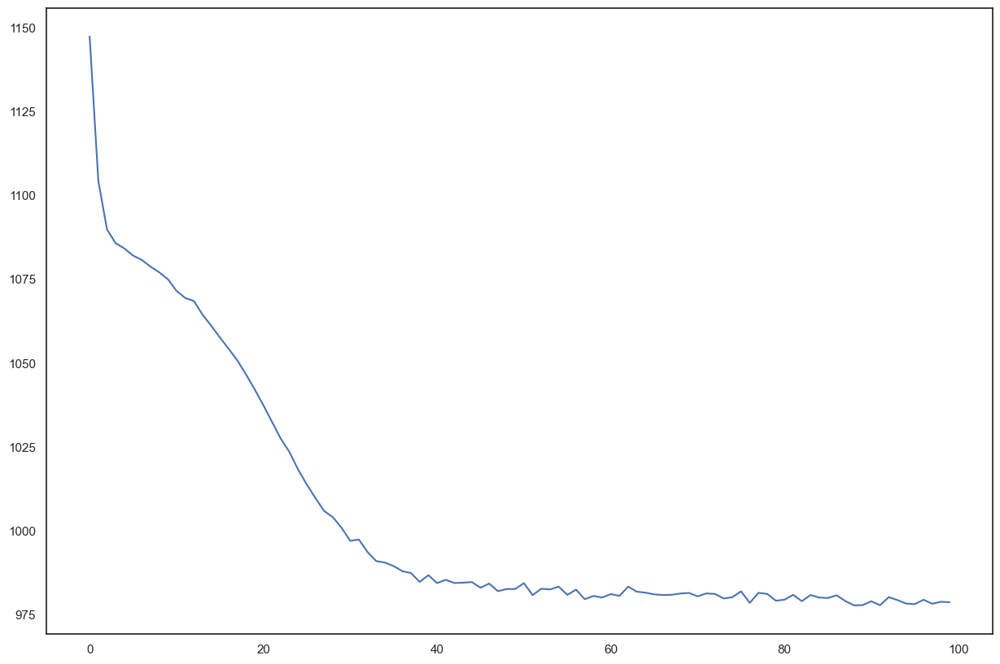

In [57]:
plt.plot(losses)

In [58]:
check_acc()

100%|██████████████████████████████████████████████████████████████████████████| 13861/13861 [00:03<00:00, 3704.48it/s]


0.7104826491595123

## Decision Tree

In [56]:
from sklearn.tree import DecisionTreeClassifier

In [59]:
clf = DecisionTreeClassifier(max_depth =3, random_state = 42)

clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=42)

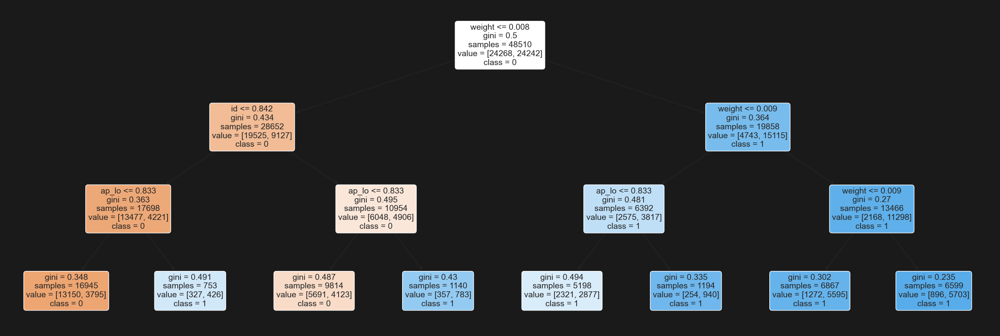

In [60]:
plt.figure(figsize=(30,10), facecolor ='k')

a = tree.plot_tree(clf,

                   feature_names = df.columns[:-1],

                   class_names = ["0","1"],

                   rounded = True,

                   filled = True,

                   fontsize=14)

plt.show()

In [61]:
y_pred = clf.predict(X_test)

In [62]:
#Accuracy
clf.score(X_test,y_test)

0.7275263335096916

In [63]:
ps = precision_score(y_pred,y_test)
rs = recall_score(y_pred, y_test)
f1s = f1_score(y_pred,y_test)
print(f"Precision {ps}\nRecall {rs}\nF1 Score {f1s}")

Precision 0.6767822736030829
Recall 0.7525441885377611
F1 Score 0.7126553385746893


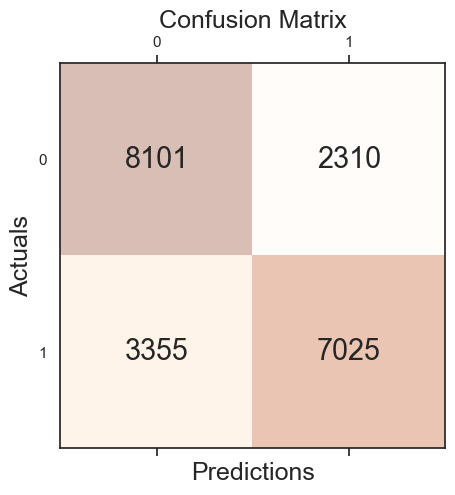

In [64]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large') 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

## KNN

In [65]:
# To Plot
y_points = []
knn = KNeighborsClassifier(n_neighbors = 1)
knn.fit(X_train, y_train)
x_points = list(range(1,101))
for k in tqdm(range(1,101)):
    knn.n_neighbors = k
    y_pred = knn.predict(X_test)
    y_points.append(accuracy_score(y_test, y_pred)*100)


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [17:57<00:00, 10.77s/it]


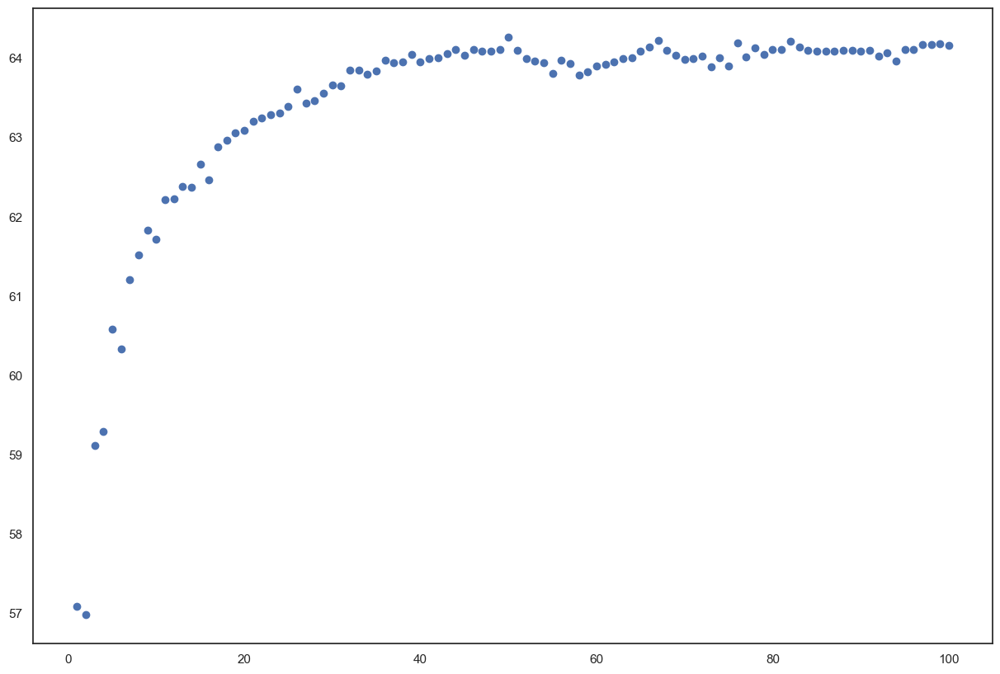

In [66]:
plt.scatter(x_points,y_points)

In [67]:
max(y_points)

64.26819296811121